<p align="right">
    <img src="Zewail-City.png">
</p>


---

# __Nuclear Data Visualization__

In [1]:
# Import Main Libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
# Load the dataset
df = pd.read_csv("Data.csv")

df.replace('-', np.nan, inplace=True)

# Convert only columns that look like they should be numeric
for col in df.columns:
    try:
        df[col] = pd.to_numeric(df[col])
    except ValueError:
        pass  # keep non-numeric 

# Helper function for filtering non-null data
def clean_df_for(*cols):
    return df.dropna(subset=list(cols)).copy()

# normalize size data
def normalize(series):
    return (series - series.min()) / (series.max() - series.min())
    
# View Head
df.head()

,Z,A,N,Eb_cal,Ebrot_cal,Eb_exp,S2n,S2p,Sn,Rn,Rp,Rm,Rch_cal,Rch_exp,beta n,beta p,beta t,lam n,lam p,m^\pi(N)
0,8,12,4,59.70,59.70,58.58,NaN,-2.37,22.05,2.329,2.915,2.734,3.022,NaN,0.000,0.000,0.000,-19.36,-2.15,0+
1,8,13,5,77.78,77.80,75.55,40.13,-1.95,18.08,2.378,2.767,2.624,2.880,NaN,0.129,0.036,0.072,-20.69,-3.55,3/2-
2,8,14,6,101.16,101.16,98.73,41.46,1.49,23.38,2.250,2.639,2.480,2.758,NaN,0.000,0.000,0.000,-23.16,-1.18,0+
3,8,15,7,112.80,112.80,111.96,35.02,9.93,11.64,2.537,2.652,2.599,2.770,NaN,0.000,0.000,0.000,-14.21,-8.43,1/2-
4,8,16,8,127.28,127.28,127.62,26.11,20.45,14.47,2.626,2.650,2.638,2.768,2.699,0.000,0.000,0.000,-14.94,-11.21,0+


In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5437 entries, 0 to 5436
Data columns (total 20 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   Z          5437 non-null   int64  
 1   A          5437 non-null   int64  
 2   N          5437 non-null   int64  
 3   Eb_cal     5437 non-null   float64
 4   Ebrot_cal  5437 non-null   float64
 5   Eb_exp     1264 non-null   float64
 6   S2n        5356 non-null   float64
 7   S2p        5388 non-null   float64
 8   Sn         5402 non-null   float64
 9   Rn         5437 non-null   float64
 10  Rp         5437 non-null   float64
 11  Rm         5437 non-null   float64
 12  Rch_cal    5437 non-null   float64
 13  Rch_exp    620 non-null    float64
 14  beta n     5437 non-null   float64
 15  beta p     5437 non-null   float64
 16  beta t     5437 non-null   float64
 17  lam n      5437 non-null   float64
 18  lam p      5437 non-null   float64
 19  m^\pi(N)   5437 non-null   object 
dtypes: float

In [4]:
df.describe()

,Z,A,N,Eb_cal,Ebrot_cal,Eb_exp,S2n,S2p,Sn,Rn,Rp,Rm,Rch_cal,Rch_exp,beta n,beta p,beta t,lam n,lam p
count,5437.000000,5437.000000,5437.000000,5437.000000,5437.000000,1264.000000,5356.000000,5388.000000,5402.000000,5437.000000,5437.000000,5437.000000,5437.000000,620.000000,5437.000000,5437.000000,5437.000000,5437.000000,5437.000000
mean,76.200478,223.743793,147.543314,1560.409601,1561.752961,1102.249660,8.050861,23.512795,4.041201,5.971297,5.518417,5.832973,5.578238,4.747379,0.116211,0.117836,0.116758,-4.151271,-11.597846
std,29.690461,98.596473,71.417809,584.865422,584.853581,473.556973,7.373814,12.472478,3.824254,1.086974,0.972395,1.046219,0.959976,0.738929,0.183910,0.180574,0.182867,3.878621,6.331431
min,8.000000,12.000000,4.000000,59.700000,59.700000,58.580000,-2.510000,-3.750000,-1.270000,2.250000,2.639000,2.480000,2.758000,2.693000,-0.452000,-0.448000,-0.450000,-28.280000,-29.910000
25%,54.000000,146.000000,91.000000,1137.810000,1138.590000,750.220000,2.140000,13.767500,1.170000,5.280000,4.878000,5.161000,4.943000,4.279000,0.000000,0.000000,0.000000,-6.110000,-16.130000
50%,80.000000,229.000000,148.000000,1657.490000,1658.510000,1151.390000,6.115000,24.620000,3.045000,6.164000,5.703000,6.034000,5.759000,4.832500,0.150000,0.145000,0.149000,-3.100000,-12.120000
75%,102.000000,303.000000,201.000000,2041.220000,2042.380000,1481.067500,11.850000,32.605000,5.960000,6.823000,6.293000,6.685000,6.344000,5.393750,0.265000,0.269000,0.267000,-1.100000,-6.660000
max,120.000000,440.000000,320.000000,2456.250000,2457.550000,1958.520000,44.350000,58.350000,26.900000,8.018000,7.201000,7.804000,7.245000,5.895000,0.578000,0.595000,0.584000,1.270000,1.880000


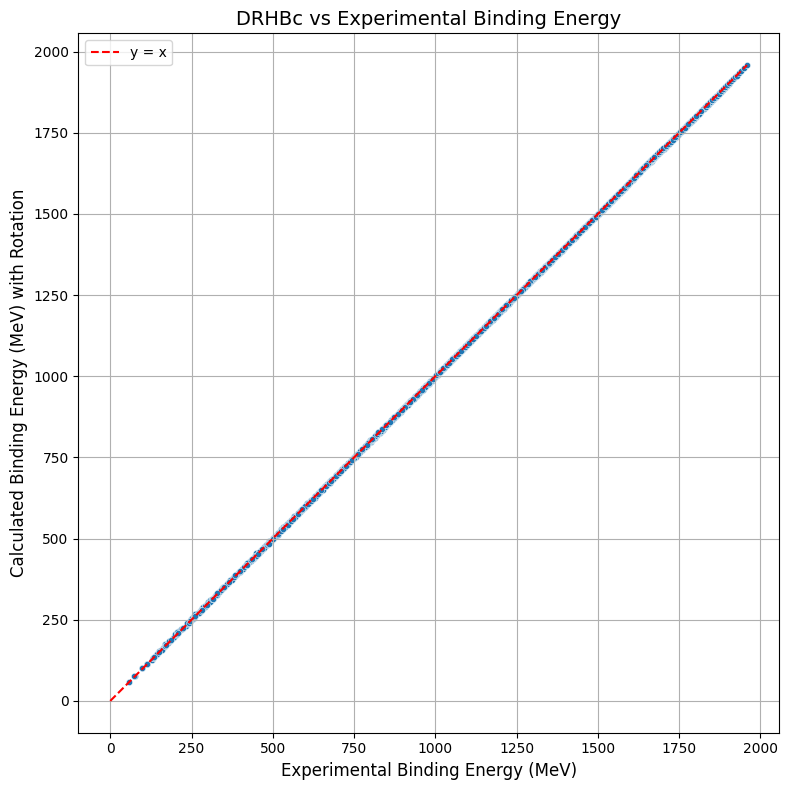

In [5]:
df_plot = clean_df_for('Eb_exp', 'Ebrot_cal')

plt.figure(figsize=(8, 8))
sns.scatterplot(data=df_plot, x='Eb_exp', y='Ebrot_cal', s=20)

max_val = max(df_plot['Eb_exp'].max(), df_plot['Ebrot_cal'].max())
plt.plot([0, max_val], [0, max_val], 'r--', label='y = x')

plt.xlabel("Experimental Binding Energy (MeV)", fontsize=12)
plt.ylabel("Calculated Binding Energy (MeV) with Rotation", fontsize=12)
plt.title("DRHBc vs Experimental Binding Energy", fontsize=14)
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

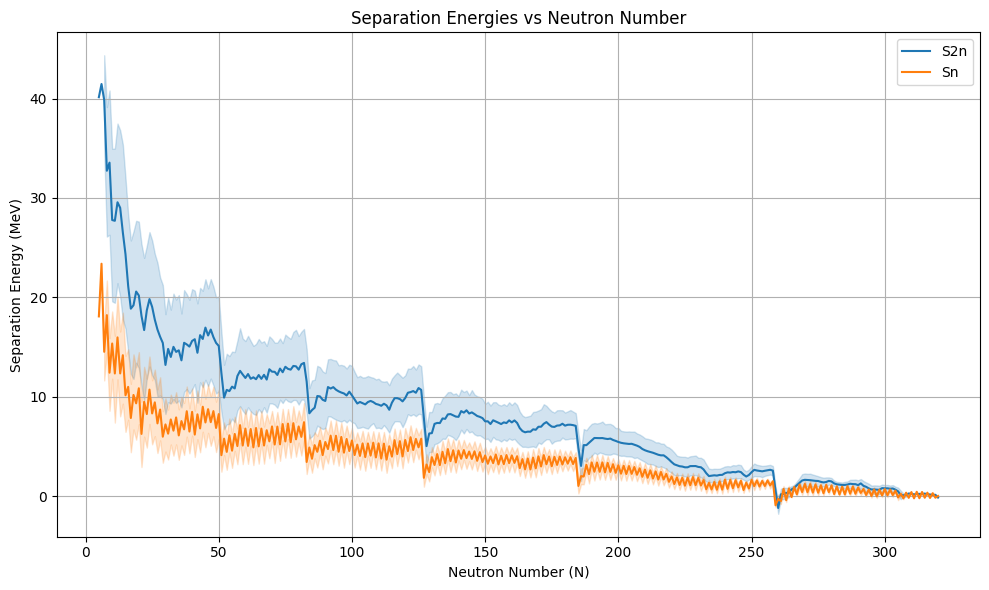

In [6]:
df_plot = clean_df_for('N', 'S2n', 'Sn')

plt.figure(figsize=(10, 6))
sns.lineplot(data=df_plot, x='N', y='S2n', label='S2n')
sns.lineplot(data=df_plot, x='N', y='Sn', label='Sn')
plt.xlabel("Neutron Number (N)")
plt.ylabel("Separation Energy (MeV)")
plt.title("Separation Energies vs Neutron Number")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

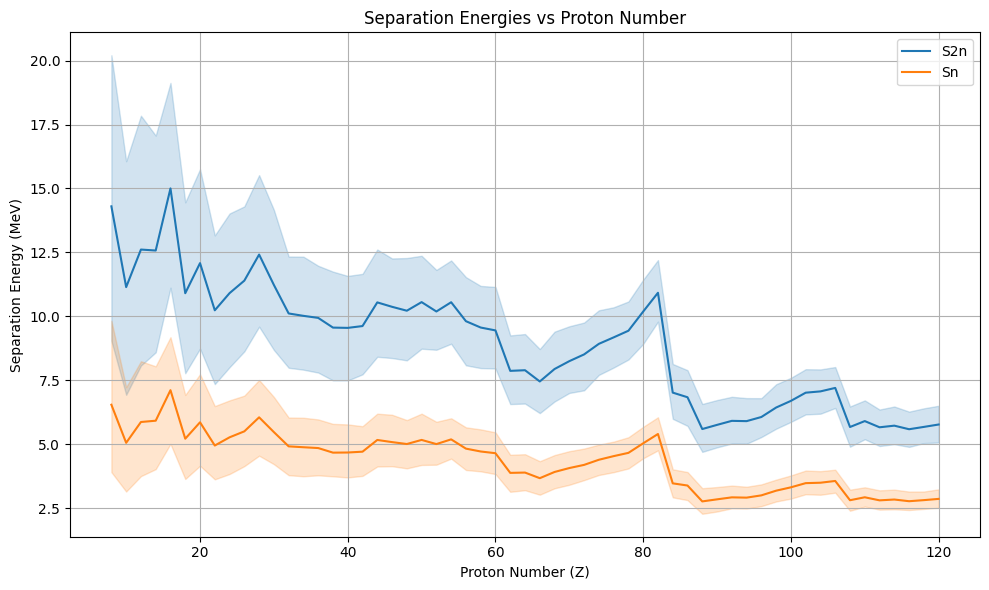

In [7]:
df_plot = clean_df_for('Z', 'S2n', 'Sn')

plt.figure(figsize=(10, 6))
sns.lineplot(data=df_plot, x='Z', y='S2n', label='S2n')
sns.lineplot(data=df_plot, x='Z', y='Sn', label='Sn')
plt.xlabel("Proton Number (Z)")
plt.ylabel("Separation Energy (MeV)")
plt.title("Separation Energies vs Proton Number")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

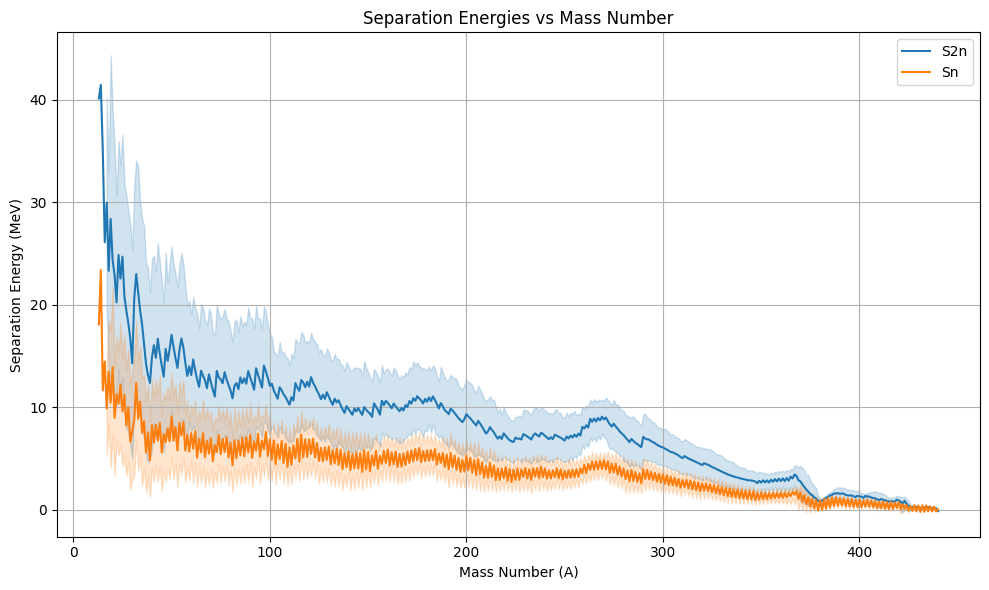

In [8]:
df_plot = clean_df_for('A', 'S2n', 'Sn')

plt.figure(figsize=(10, 6))
sns.lineplot(data=df_plot, x='A', y='S2n', label='S2n')
sns.lineplot(data=df_plot, x='A', y='Sn', label='Sn')
plt.xlabel("Mass Number (A)")
plt.ylabel("Separation Energy (MeV)")
plt.title("Separation Energies vs Mass Number")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

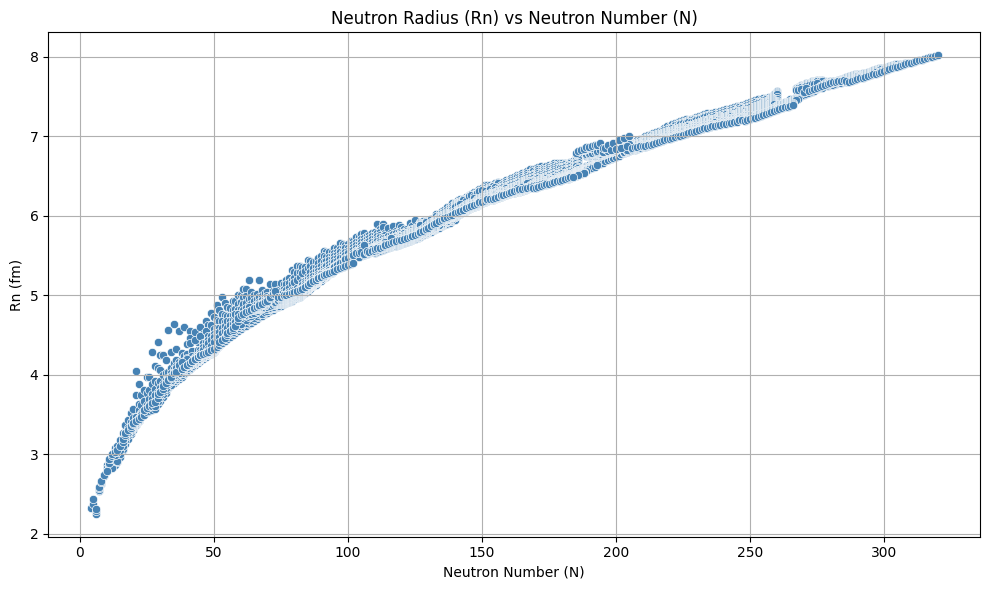

In [9]:
df_plot = df.dropna(subset=['N', 'Rn'])

plt.figure(figsize=(10, 6))
sns.scatterplot(data=df_plot, x='N', y='Rn', color='steelblue')
plt.title("Neutron Radius (Rn) vs Neutron Number (N)")
plt.xlabel("Neutron Number (N)")
plt.ylabel("Rn (fm)")
plt.grid(True)
plt.tight_layout()
plt.show()


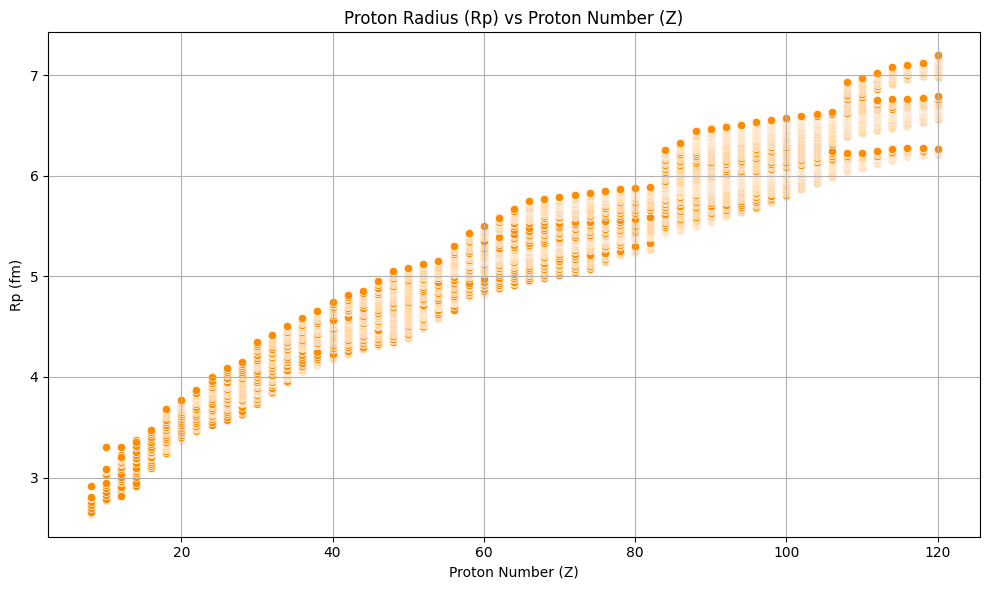

In [10]:
df_plot = df.dropna(subset=['Z', 'Rp'])

plt.figure(figsize=(10, 6))
sns.scatterplot(data=df_plot, x='Z', y='Rp', color='darkorange')
plt.title("Proton Radius (Rp) vs Proton Number (Z)")
plt.xlabel("Proton Number (Z)")
plt.ylabel("Rp (fm)")
plt.grid(True)
plt.tight_layout()
plt.show()


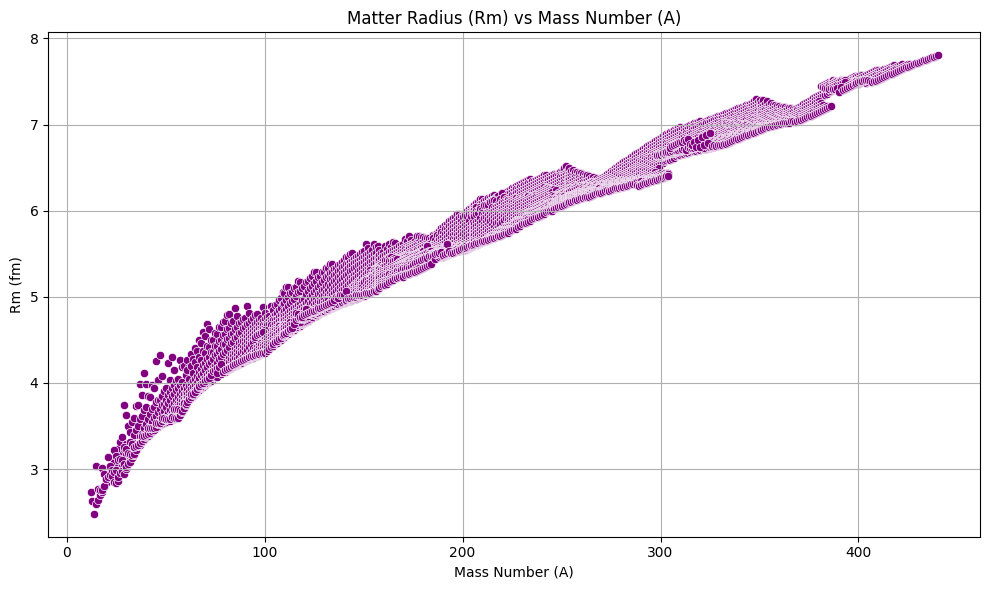

In [11]:
df_plot = df.dropna(subset=['A', 'Rm'])

plt.figure(figsize=(10, 6))
sns.scatterplot(data=df_plot, x='A', y='Rm', color='purple')
plt.title("Matter Radius (Rm) vs Mass Number (A)")
plt.xlabel("Mass Number (A)")
plt.ylabel("Rm (fm)")
plt.grid(True)
plt.tight_layout()
plt.show()

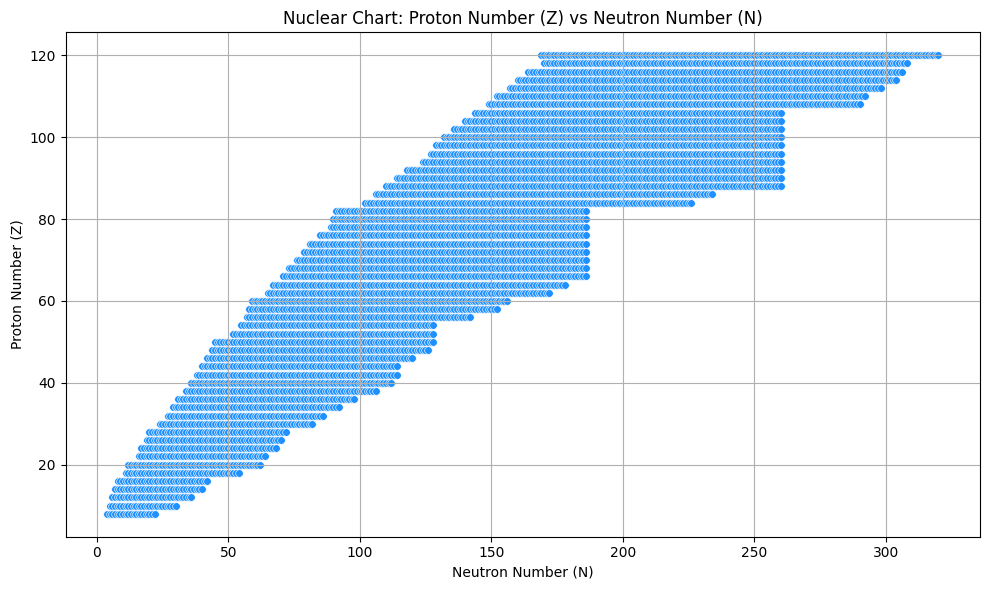

In [12]:
df_plot = df.dropna(subset=['Z', 'N'])

# Plot
plt.figure(figsize=(10, 6))
sns.scatterplot(data=df_plot, x='N', y='Z', s=30, color='dodgerblue')

plt.title("Nuclear Chart: Proton Number (Z) vs Neutron Number (N)")
plt.xlabel("Neutron Number (N)")
plt.ylabel("Proton Number (Z)")
plt.grid(True)
plt.tight_layout()
plt.show()

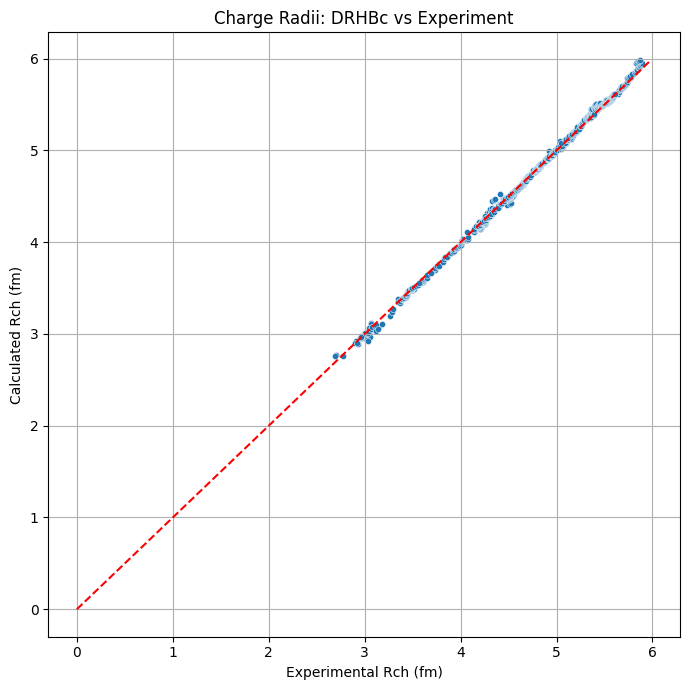

In [13]:
df_plot = clean_df_for('Rch_cal', 'Rch_exp')

plt.figure(figsize=(7, 7))
sns.scatterplot(data=df_plot, x='Rch_exp', y='Rch_cal', s=20)
max_val = max(df_plot['Rch_exp'].max(), df_plot['Rch_cal'].max())
plt.plot([0, max_val], [0, max_val], 'r--')

plt.xlabel("Experimental Rch (fm)")
plt.ylabel("Calculated Rch (fm)")
plt.title("Charge Radii: DRHBc vs Experiment")
plt.grid(True)
plt.tight_layout()
plt.show()

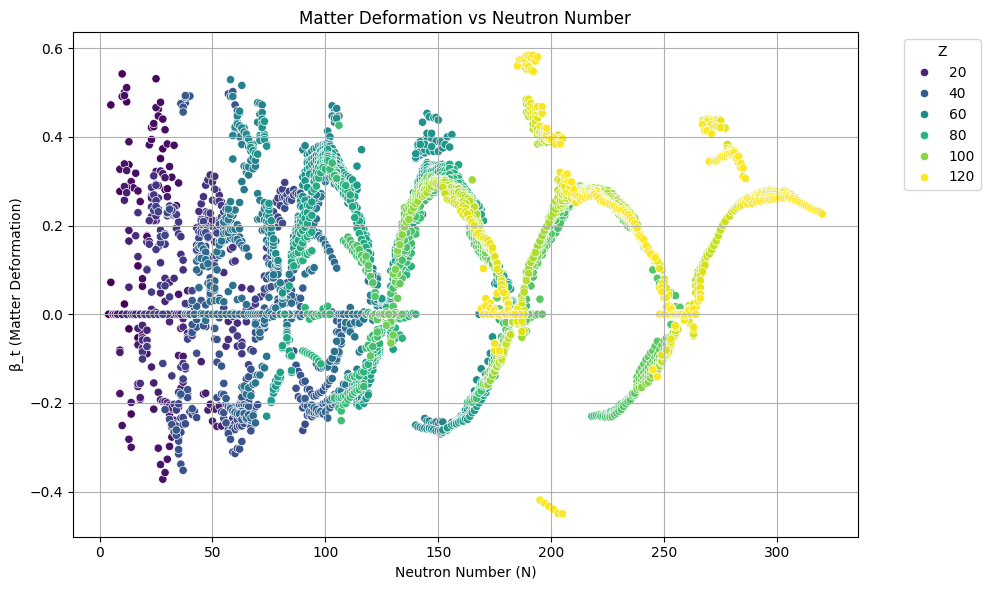

In [14]:
df_plot = clean_df_for('N', 'beta t', 'Z')

plt.figure(figsize=(10, 6))
sns.scatterplot(data=df_plot, x='N', y='beta t', hue='Z', palette='viridis')
plt.title("Matter Deformation vs Neutron Number")
plt.xlabel("Neutron Number (N)")
plt.ylabel("β_t (Matter Deformation)")
plt.legend(title='Z', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True)
plt.tight_layout()
plt.show()

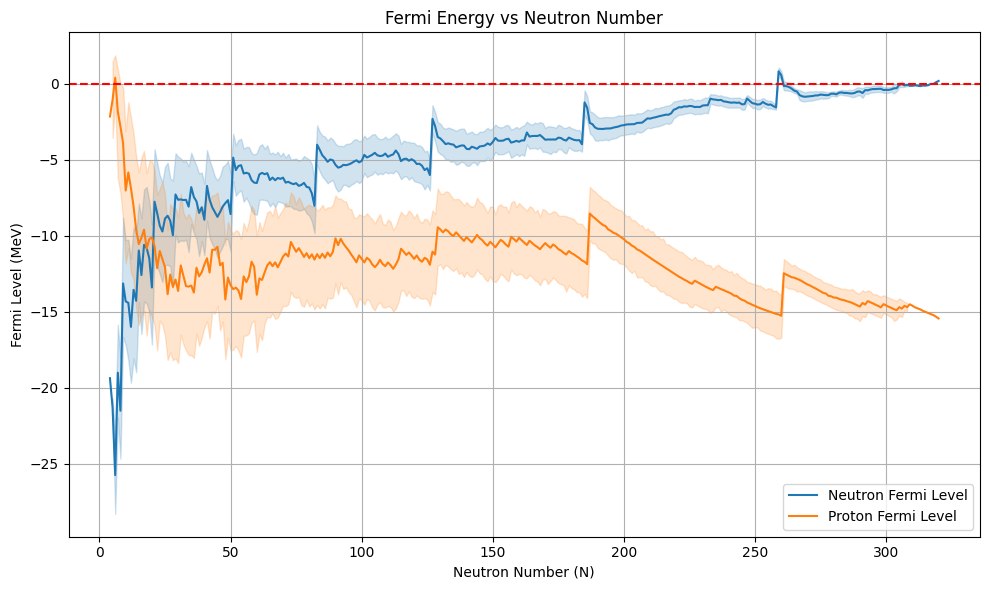

In [15]:
df_plot = clean_df_for('N', 'lam n', 'lam p')

plt.figure(figsize=(10, 6))
sns.lineplot(data=df_plot, x='N', y='lam n', label='Neutron Fermi Level')
sns.lineplot(data=df_plot, x='N', y='lam p', label='Proton Fermi Level')
plt.axhline(0, color='red', linestyle='--')
plt.title("Fermi Energy vs Neutron Number")
plt.xlabel("Neutron Number (N)")
plt.ylabel("Fermi Level (MeV)")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

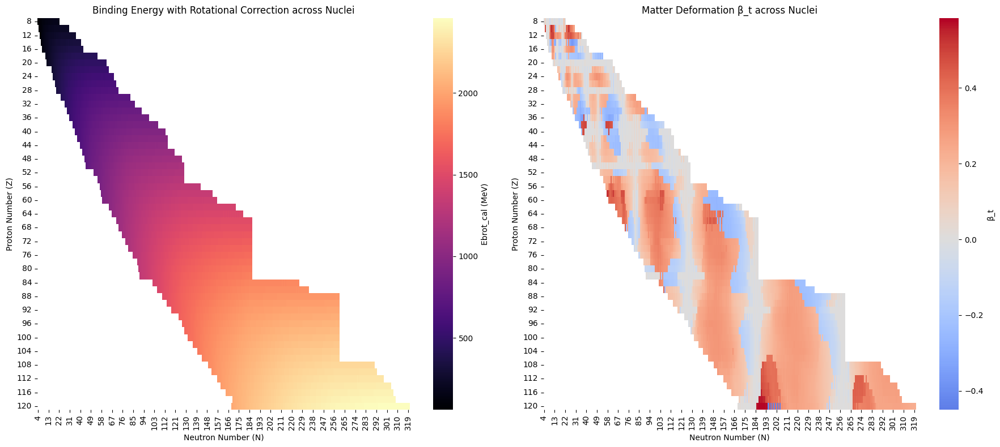

In [16]:
# Prepare data for first heatmap
df_plot1 = df.dropna(subset=['Z', 'N', 'Ebrot_cal'])
pivot1 = df_plot1.pivot_table(index='Z', columns='N', values='Ebrot_cal')

# Prepare data for second heatmap
df_plot2 = df.dropna(subset=['Z', 'N', 'beta t'])
pivot2 = df_plot2.pivot_table(index='Z', columns='N', values='beta t')

# Create figure with subplots
fig, axes = plt.subplots(1, 2, figsize=(18, 8))

# First subplot - Ebrot_cal
sns.heatmap(pivot1, cmap='magma', cbar_kws={'label': 'Ebrot_cal (MeV)'}, ax=axes[0])
axes[0].set_title("Binding Energy with Rotational Correction across Nuclei")
axes[0].set_xlabel("Neutron Number (N)")
axes[0].set_ylabel("Proton Number (Z)")

# Second subplot - beta t
sns.heatmap(pivot2, cmap='coolwarm', center=0, cbar_kws={'label': 'β_t'}, ax=axes[1])
axes[1].set_title("Matter Deformation β_t across Nuclei")
axes[1].set_xlabel("Neutron Number (N)")
axes[1].set_ylabel("Proton Number (Z)")

# Adjust layout
plt.tight_layout()
plt.show()

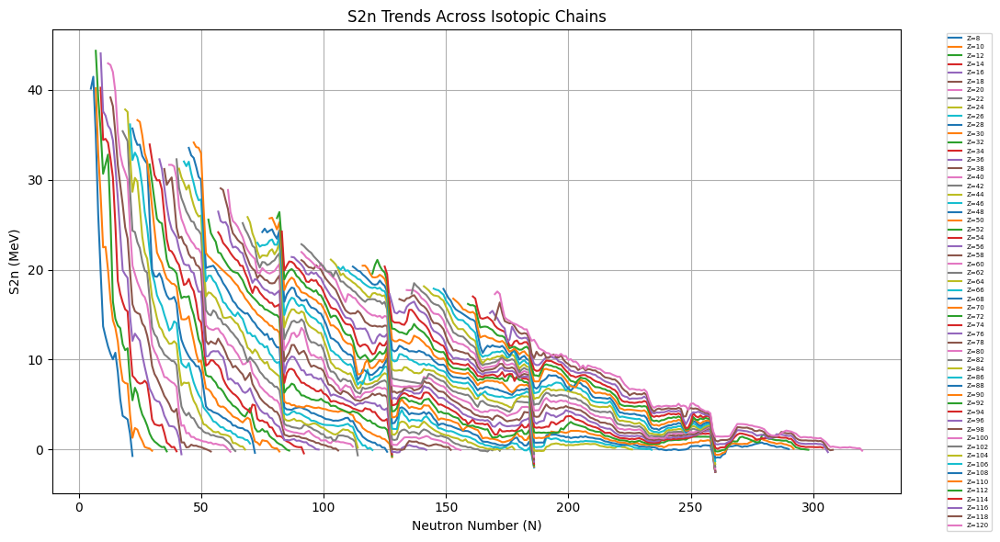

In [17]:
df_plot = df.dropna(subset=['Z', 'N', 'S2n'])

plt.figure(figsize=(10, 6))
for Z_val in sorted(df_plot['Z'].unique()):
    sub_df = df_plot[df_plot['Z'] == Z_val]
    plt.plot(sub_df['N'], sub_df['S2n'], label=f'Z={int(Z_val)}')

plt.xlabel("Neutron Number (N)")
plt.ylabel("S2n (MeV)")
plt.title("S2n Trends Across Isotopic Chains")
plt.grid(True)
plt.tight_layout()
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=5)
plt.show()


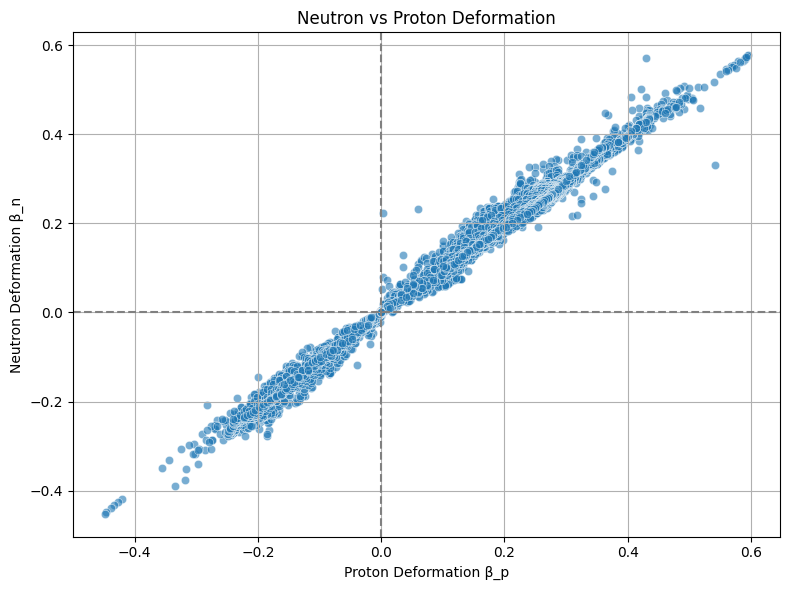

In [18]:
df_plot = df.dropna(subset=['beta n', 'beta p'])

plt.figure(figsize=(8, 6))
sns.scatterplot(data=df_plot, x='beta p', y='beta n', alpha=0.6)
plt.axhline(0, color='gray', linestyle='--')
plt.axvline(0, color='gray', linestyle='--')
plt.xlabel("Proton Deformation β_p")
plt.ylabel("Neutron Deformation β_n")
plt.title("Neutron vs Proton Deformation")
plt.grid(True)
plt.tight_layout()
plt.show()


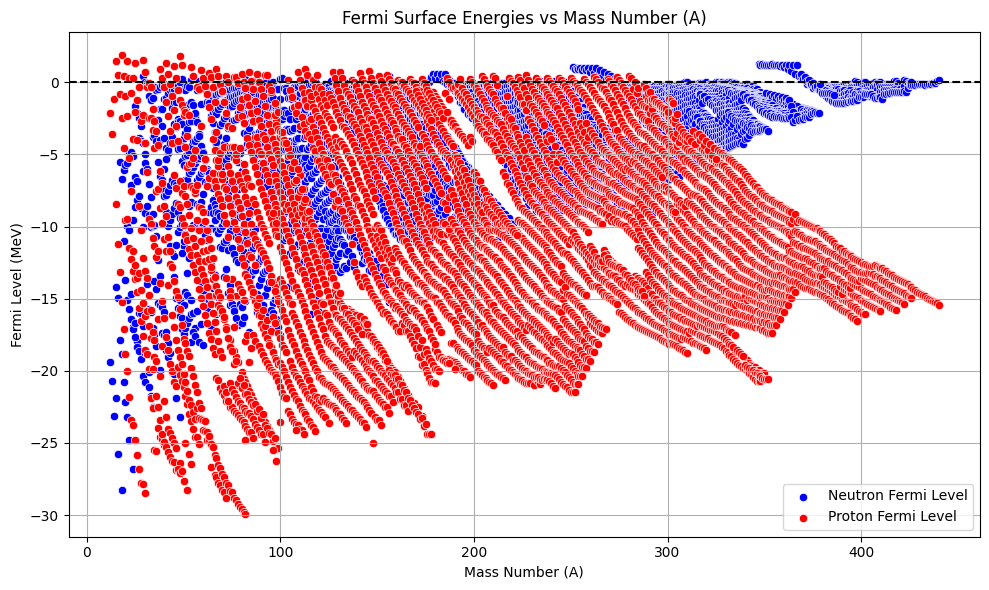

In [19]:
df_plot = df.dropna(subset=['A', 'lam n', 'lam p'])

plt.figure(figsize=(10, 6))
sns.scatterplot(data=df_plot, x='A', y='lam n', label='Neutron Fermi Level', color='blue')
sns.scatterplot(data=df_plot, x='A', y='lam p', label='Proton Fermi Level', color='red')
plt.axhline(0, linestyle='--', color='black')
plt.title("Fermi Surface Energies vs Mass Number (A)")
plt.xlabel("Mass Number (A)")
plt.ylabel("Fermi Level (MeV)")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

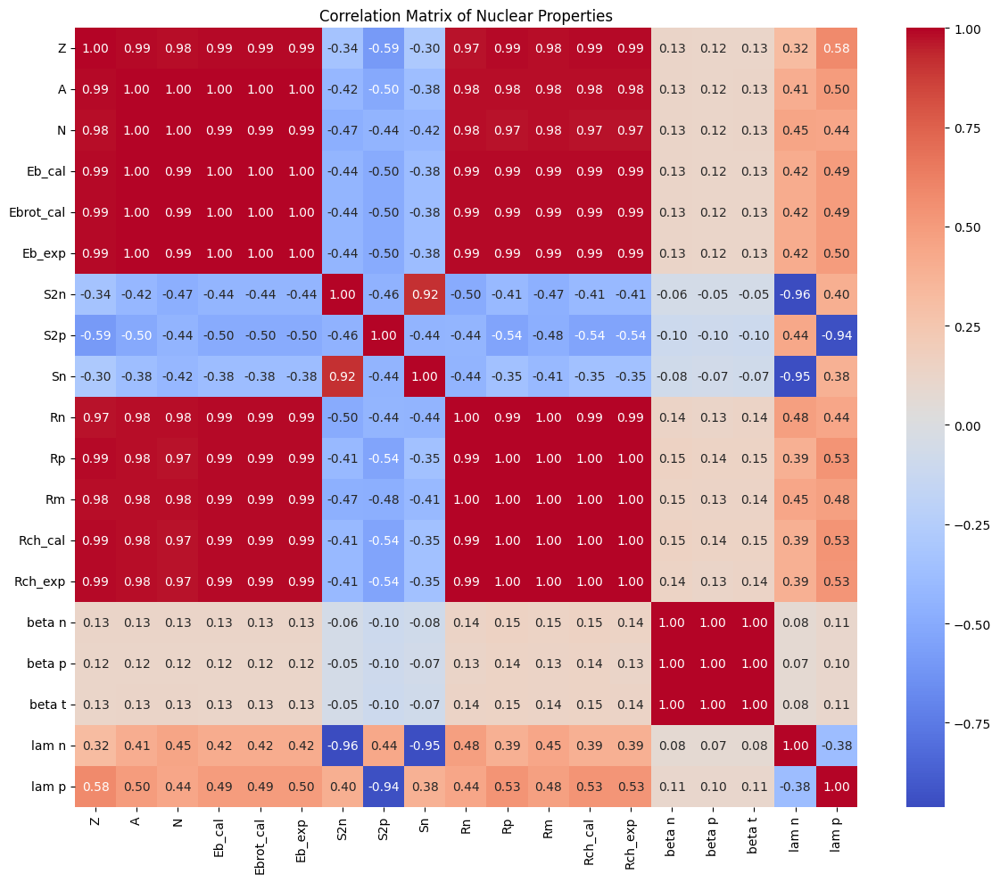

In [20]:
# Drop non-numeric columns and rows with NaNs
df_corr = df.select_dtypes(include=[np.number]).dropna()

plt.figure(figsize=(12, 10))
sns.heatmap(df_corr.corr(), annot=True, fmt=".2f", cmap='coolwarm')
plt.title("Correlation Matrix of Nuclear Properties")
plt.tight_layout()
plt.show()

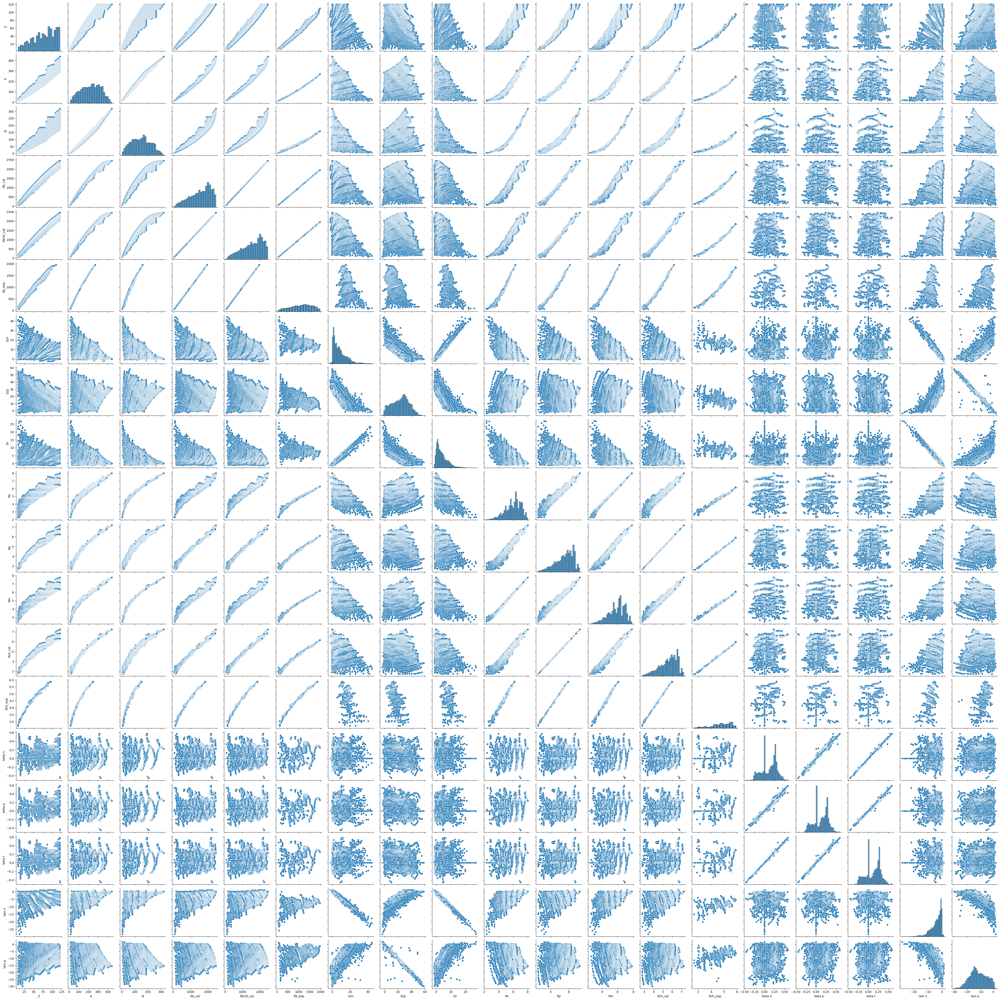

In [21]:
sns.pairplot(df)

---
## Refrences:

[1] P. Guo et al., “Nuclear mass table in deformed relativistic Hartree–Bogoliubov theory in continuum, II: Even-Z nuclei,” Atomic Data and Nuclear Data Tables, vol. 158, p. 101661, Jul. 2024, doi: https://doi.org/10.1016/j.adt.2024.101661.